In [2]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from torchvision import models
from torchvision import transforms
from PIL import Image
import os
import scipy.io

# Предобработка фреймов, путём удаления тех изображений, на которых нет людей

In [3]:
import torch
from torchvision import models, transforms
from PIL import Image
import os

# Загружаем предварительно обученную модель Faster R-CNN
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Определите устройство (GPU или CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Функция для обнаружения объектов на изображении
def detect_objects(image_path):
    # Открываем изображение
    img = Image.open(image_path).convert("RGB")
    img_tensor = transforms.ToTensor()(img).to(device)
    img_tensor = img_tensor.unsqueeze(0)

    # Получаем предсказания модели
    with torch.no_grad():
        prediction = model(img_tensor)

    return prediction

# Папка с изображениями
image_folder = 'image'

# Рекурсивная функция для обработки изображений в папке и подпапках
def process_images_in_folder(folder_path):
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            image_path = os.path.join(root, file)

            # Получаем предсказания модели
            predictions = detect_objects(image_path)

            # Проверяем, есть ли человек на изображении
            person_detected = any(score.item() > 0.5 for score in predictions[0]['scores'])

            if not person_detected:
                # Удаляем изображение, если не обнаружен человек
                os.remove(image_path)
                print(f"Removed: {image_path}")
            else:
                print(f"Person detected in: {image_path}")

# Вызываем функцию для обработки изображений в папке и подпапках
process_images_in_folder(image_folder)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame0.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame1.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame10.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame11.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame12.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame13.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame14.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame15.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame16.jpg
Person detected in: image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0/frame17.jpg
Person detected in: im

# ResNet 3D

In [4]:
#1. Define the data path and import myutils
import os
import imutils
import sys
sys.path.append("/home/jupyter/datasphere/project/myutils.py")
import myutils

path2data="./data"
sub_folder_jpg="image"
path2ajpgs=os.path.join(path2data, sub_folder_jpg)

#2. The frame of each video is stored in a folder with the same name as the video. Call get in myutils_ Vids helper function to obtain a list of video file names and labels:
all_vids, all_labels, catgs=myutils.get_vids(path2ajpgs)

print(len(all_vids), len(all_labels), len(catgs))
print(all_vids[:3], all_labels[:3],catgs[:3])

#3. Define a Python dictionary to store the value of the label
labels_dict={}
ind=0
for uc in catgs:
	labels_dict[uc]=ind
	ind+=1
print(labels_dict)

num_classes=24
unique_ids=[id_ for id_, label in zip(all_vids,all_labels) if labels_dict[label]<num_classes]
unique_labels=[label for id_,label in zip(all_vids,all_labels) if labels_dict[label]<num_classes]
print(len(unique_ids),len(unique_labels))

# Разделяем данные на тренировочный и валидационный наборы
from sklearn.model_selection import train_test_split

# Параметры для train_test_split
validation_size = 0.2  # Используем 20% данных для валидации
random_state = 0

# Разделяем данные на тренировочный и валидационный наборы
train_ids, valid_ids, train_labels, valid_labels = train_test_split(unique_ids, unique_labels, test_size=validation_size, random_state=random_state)

# Выводим размеры тренировочного и валидационного наборов
print(f"Размер тренировочного набора: {len(train_ids)}, Размер тренировочных меток: {len(train_labels)}")
print(f"Размер валидационного набора: {len(valid_ids)}, Размер валидационных меток: {len(valid_labels)}")

2826 2826 25
['./data/image/cartwheel/(Rad)Schlag_die_Bank!_cartwheel_f_cm_np1_le_med_0', './data/image/cartwheel/Acrobacias_de_un_fenomeno_cartwheel_f_cm_np1_ba_bad_8', './data/image/cartwheel/Acrobacias_de_un_fenomeno_cartwheel_f_cm_np1_fr_bad_3'] ['cartwheel', 'cartwheel', 'cartwheel'] ['cartwheel', 'catch', 'clap']
{'cartwheel': 0, 'catch': 1, 'clap': 2, 'climb': 3, 'dive': 4, 'draw_sword': 5, 'dribble': 6, 'fencing': 7, 'flic_flac': 8, 'golf': 9, 'handstand': 10, 'hit': 11, 'jump': 12, 'pick': 13, 'pour': 14, 'pullup': 15, 'push': 16, 'pushup': 17, 'shoot_ball': 18, 'sit': 19, 'situp': 20, 'swing_baseball': 21, 'sword_exercise': 22, 'throw': 23, '.ipynb_checkpoints': 24}
2826 2826
Размер тренировочного набора: 2260, Размер тренировочных меток: 2260
Размер валидационного набора: 566, Размер валидационных меток: 566


2260
torch.Size([16, 3, 240, 320]) 8 tensor(-1.8952) tensor(2.8736)


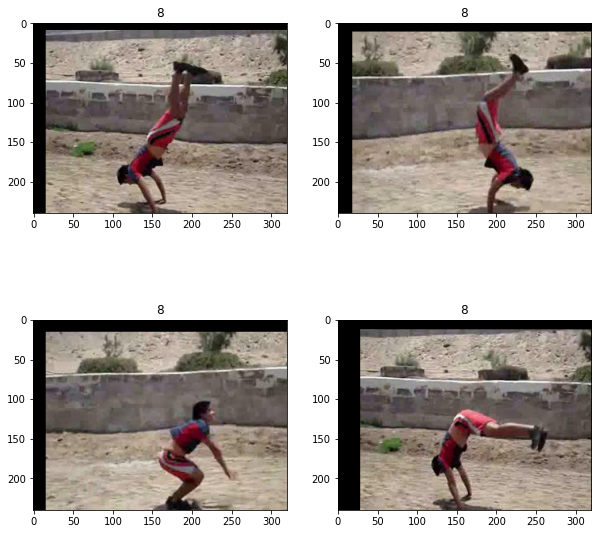

566
torch.Size([16, 3, 240, 320]) 8 tensor(-1.8952) tensor(2.8736)


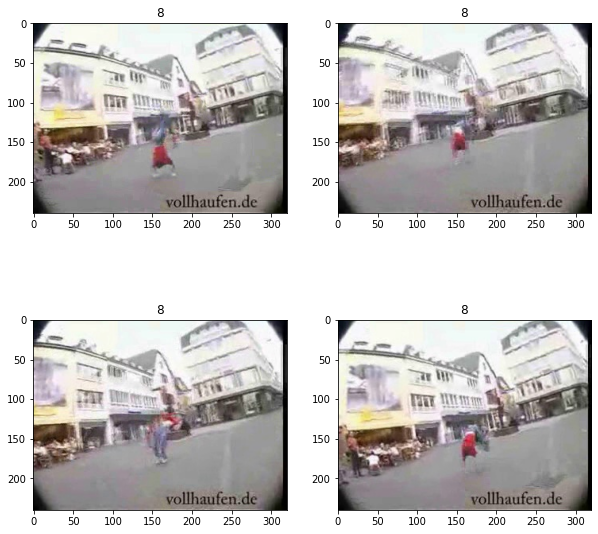

In [14]:
#1. Import the required package
from torch.utils.data import Dataset, DataLoader, Subset
import glob
from PIL import Image
import torch
import numpy as np
import random
import torchvision.transforms as transforms
import torchvision.models as models
import myutils  # Подразумевается, что у вас есть модуль myutils с функцией denormalize

import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import random
import matplotlib.pylab as plt
import glob

# Seed for reproducibility
np.random.seed(2021)
random.seed(2021)
torch.manual_seed(2021)

# Define dataset class
class VideoDataset(Dataset):
    def __init__(self, ids, labels, transform):
        self.transform = transform
        self.ids = ids
        self.labels = labels

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        path2imgs = glob.glob(self.ids[idx] + "/*.jpg")
        path2imgs = path2imgs[:timesteps]
        label = labels_dict[self.labels[idx]]
        frames = []
        for p2i in path2imgs:
            frame = Image.open(p2i)
            frames.append(frame)
        
        seed = np.random.randint(1e9)
        frames_tr = []
        for frame in frames:
            random.seed(seed)
            np.random.seed(seed)
            frame = self.transform(frame)
            frames_tr.append(frame)
        
        if len(frames_tr) > 0:
            frames_tensor = torch.stack(frames_tr)
        else:
            # Handle the case when frames_tr is empty
            frames_tensor = torch.empty(0)

        return frames_tensor, label

# Define the transformation parameters
model_type = "3dcnn"
# model_type="rnn"  # either-or
timesteps = 16
if model_type == "rnn":
    h, w = 224, 224
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
else:
    h, w = 112, 112  # Change to 240x240 and adjust mean and std accordingly
    mean = [0.43216, 0.394666, 0.37645]
    std = [0.22803, 0.22145, 0.216989]

# Define the transformation function for the training set
train_transformer = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Instantiate dataset class
train_ds = VideoDataset(ids=train_ids, labels=train_labels, transform=train_transformer)
print(len(train_ds))

# Get train_A data in DS
imgs, label = train_ds[1]
if len(imgs) > 0:
    print(imgs.shape, label, torch.min(imgs), torch.max(imgs))

# Display some frame data
plt.figure(figsize=(10, 10))
for ii, img in enumerate(imgs[::4]):
    plt.subplot(2, 2, ii+1)
    if len(imgs) > 0:
        plt.imshow(myutils.denormalize(img, mean, std))
        plt.title(label)
plt.show()

# Define the transformation function for the validation set
valid_transformer = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Instantiate the dataset class valid_ds
valid_ds = VideoDataset(ids=valid_ids, labels=valid_labels, transform=valid_transformer)
print(len(valid_ds))

# Get validation data from the dataset
imgs, label = valid_ds[1]
print(imgs.shape, label, torch.min(imgs), torch.max(imgs))

# Display validation dataset frames
plt.figure(figsize=(10, 10))
for ii, img in enumerate(imgs[::4]):
    plt.subplot(2, 2, ii+1)
    if len(imgs) > 0:
        plt.imshow(myutils.denormalize(img, mean, std))
        plt.title(label)
plt.show()


In [17]:
# Scheduled to collapse_fn_3dcnn auxiliary function
def collate_fn_3dcnn(batch):
    imgs_batch, label_batch = zip(*batch)
    
    # Resize or crop frames to a consistent size
    imgs_batch_resized = []
    for imgs in imgs_batch:
        if len(imgs) > 0:
            # Resize or crop each frame to the desired size
            resized_imgs = [transforms.Resize((h, w))(img) for img in imgs]
            imgs_batch_resized.append(torch.stack(resized_imgs))

    label_batch = [torch.tensor(l) for l, imgs in zip(label_batch, imgs_batch_resized) if len(imgs) > 0]
    imgs_tensor = torch.stack(imgs_batch_resized)
    imgs_tensor = torch.transpose(imgs_tensor, 2, 1)
    labels_tensor = torch.stack(label_batch)
    return imgs_tensor, labels_tensor

# Define collate_fn_rnn auxiliary function
def collate_fn_rnn(batch):
    imgs_batch, label_batch = zip(*batch)
    
    # Resize or crop frames to a consistent size
    imgs_batch_resized = []
    for imgs in imgs_batch:
        if len(imgs) > 0:
            # Resize or crop each frame to the desired size
            resized_imgs = [transforms.Resize((h, w))(img) for img in imgs]
            imgs_batch_resized.append(torch.stack(resized_imgs))

    label_batch = [torch.tensor(l) for l, imgs in zip(label_batch, imgs_batch_resized) if len(imgs) > 0]
    imgs_tensor = torch.stack(imgs_batch_resized)
    labels_tensor = torch.stack(label_batch)
    return imgs_tensor, labels_tensor

# 1. Define data loader
batch_size = 16

if model_type == "rnn":
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, collate_fn=collate_fn_rnn)
    valid_dl = DataLoader(valid_ds, batch_size=2 * batch_size, shuffle=False, collate_fn=collate_fn_rnn)
else:
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, collate_fn=collate_fn_3dcnn)
    valid_dl = DataLoader(valid_ds, batch_size=2 * batch_size, shuffle=False, collate_fn=collate_fn_3dcnn)

# 2. Now, set the model type to "3dcnn" and start from train_dl get a small batch of data:
for xb, yb in train_dl:
    print(xb.shape, yb.shape)
    break

# Repeat the previous steps, but this time use the model_type is set to "rnn". You will see the following output:
# torch.Size([16, 16, 3, 224, 224]) torch.Size([16])

# 3. Now, let's use valid_dl instead of test_dl for validation data:
for xb, yb in valid_dl:
    print(xb.shape, yb.shape)
    break


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

torch.Size([16, 3, 16, 112, 112]) torch.Size([16])


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

torch.Size([31, 3, 16, 112, 112]) torch.Size([31])


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Epoch 0/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.021769, dev loss:0.177639, accuracy:0.53
----------
Epoch 1/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.024156, dev loss:0.177490, accuracy:0.53
----------
Epoch 2/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.021797, dev loss:0.177230, accuracy:0.53
----------
Epoch 3/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.024009, dev loss:0.176749, accuracy:0.71
----------
Epoch 4/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.022390, dev loss:0.176040, accuracy:0.71
----------
Epoch 5/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.020795, dev loss:0.175464, accuracy:0.71
----------
Epoch 6/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.023565, dev loss:0.174992, accuracy:0.71
----------
Epoch 7/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.022555, dev loss:0.174411, accuracy:0.71
----------
Epoch 8/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.023033, dev loss:0.173931, accuracy:0.71
----------
Epoch 9/9, current lr=3e-05


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Copied best model weights
Train loss:0.023363, dev loss:0.173538, accuracy:0.71
----------


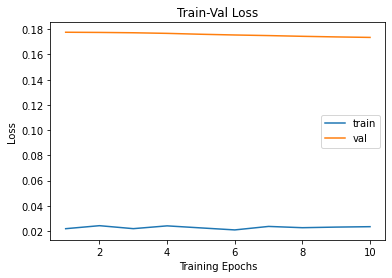

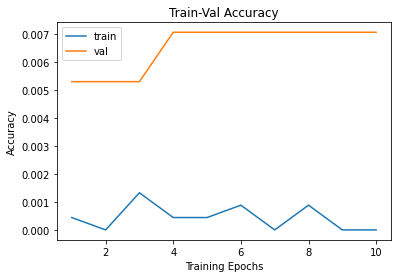

In [19]:
# 1. Define loss function, optimizer, and learning rate plan:
from torch import optim
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau


loss_func = nn.CrossEntropyLoss(reduction="sum")
opt = optim.Adam(model.parameters(), lr=3e-5)
# The change of LR in cosine annealing learning rate is periodic, T_max is 1 / 2 of the period; eta_min(float) represents the minimum learning rate, which is 0 by default;
# last_epoch(int) represents the number of previous epoch, which is used to indicate whether the learning rate needs to be adjusted. When last_ When the epoch meets the set interval,
# The learning rate will be adjusted. When - 1, the learning rate is set to the initial value.
# lr_scheduler = CosineAnnealingLR(opt, T_max=20, verbose=True)
lr_scheduler = ReduceLROnPlateau(opt, mode="min", factor=0.5, patience=5, verbose=1)
os.makedirs("./models", exist_ok=True)



# 2. Call train in myutils_Val auxiliary function training model
params_train = {
    "num_epochs": 10,
    "optimizer": opt,
    "loss_func": loss_func,
    "train_dl": train_dl,
    "val_dl": valid_dl,  # Change this line to use the validation dataset
    "sanity_check": True,
    "lr_scheduler": lr_scheduler,
    "path2weights": "./models/weights2_" + model_type + ".pt",
}
model, loss_hist, metric_hist = myutils.train_val(model, params_train)


# After running the previous code snippet, the training will begin, and you should see its progress on the screen.

# 3. After training, draw the training progress
myutils.plot_loss(loss_hist, metric_hist)
# The previous clip will show a graph of loss and accuracy.
